In [98]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import chain
sns.set()


def bar_annotation(ax, option='number'):
    '''
    This function is to add according number or percentage on every bar
    option: number or percentage, default is number
    ax: the figure object
    '''
    try:
        if option == 'number':
            for i in ax.patches:
                ax.text(i.get_x(), i.get_height()+.5, i.get_height(),
                         fontsize=15, color='dimgrey')
        if option == 'percentage':
            totals = []
            for i in ax.patches:
                totals.append(i.get_height())
                total = sum(totals)
            for i in ax.patches:
                ax.text(i.get_x(), i.get_height()+.5,
                        str(round((i.get_height()/total)*100, 2))+'%',
                        fontsize=15, color='dimgrey')
    except:
        return('inputs are wrong')


def total_seconds(time):
    '''
    Convert the resolution of time to hours
    '''
    return time.total_seconds()/3600

In [99]:
root_direc = 'H:Research/Hand_dirty/SAH_data/'
patient = pd.read_csv(
        root_direc+"/patient_encounter/Pat_file_ENC.csv")
patient['PATIENT_SK'].nunique()                      # 4810
SAH_ENC_screened_24h_rule = pd.read_csv(
  root_direc+"/patient_encounter/SAH_ENC_screened_24h_rule.csv")
SAH_ENC_screened_24h_rule['PATIENT_SK'].nunique()    # 4810
SAH_ENC_screened_24h_rule['ENCOUNTER_ID'].nunique()  # 4823
SAH_ENC_screened_24h_rule.shape
# Get a new patient level table by adding information such as encounter ID
pat_enc_final = pd.merge(patient, SAH_ENC_screened_24h_rule, on='PATIENT_SK')
pat_enc_final.shape

(4823, 57)

In [100]:
pd.options.display.max_rows = 50
pd.options.display.max_columns = 10
root_dir = 'H:Research/Hand_dirty/SAH_data/'
enc_med_cl2 = pd.read_csv(root_dir+'medication/sah_pts_enc_med_sl_ad_cl2_gz.tsv',
                          delimiter='\t')
enc_med_cl3 = pd.read_csv(root_dir+'medication/sah_pts_all_enc_med_cl3_v2.tsv',
                          delimiter='\t')
# In order to get the dose quantity,
# we need to merge some columns between enc_med_cl2 and enc_med_cl3
enc_med_cl2 = pd.merge(enc_med_cl2, enc_med_cl3[['INDEX_ID', 'DOSE_QUANTITY',
                       'ORDER_NO', 'TOTAL_DISPENSED_DOSES', 'CREDIT_QUANTITY',
                       'CHARGE_QUANTITY' ,'INFUSION_TIME',
                       'DOSE_FORM_DESCRIPTION', 'ROUTE_DESCRIPTION',
                       'INITIAL_DOSE_QUANTITY']],
                        on='INDEX_ID')


In [101]:
enc_med_cl2['PRODUCT_STRENGTH_DESCRIPTION'] = enc_med_cl2[
        'PRODUCT_STRENGTH_DESCRIPTION'].str.replace("mL", "ml")
enc_med_cl2['MED_STARTED_DT_TM'] = pd.to_datetime(
        enc_med_cl2['MED_STARTED_DT_TM'])
start_tm_na_ind = (enc_med_cl2['MED_STARTED_DT_TM'].apply(str)
                   == '01-JAN-1000 00:00:00')
stop_tm_na_ind = (enc_med_cl2['MED_STOPPED_DT_TM'].apply(str)
                  == '01-JAN-1000 00:00:00')
enc_med_cl2['MED_STOPPED_DT_TM'][stop_tm_na_ind] = np.nan
enc_med_cl2['MED_STOPPED_DT_TM'] = pd.to_datetime(
        enc_med_cl2['MED_STOPPED_DT_TM'])
enc_med_cl2['stop_start_gap'] = enc_med_cl2['MED_STOPPED_DT_TM'] -\
                 enc_med_cl2['MED_STARTED_DT_TM']
enc_med_cl2['stop_start_gap'] = enc_med_cl2['stop_start_gap'].\
                                apply(total_seconds)
discon_tm_na_ind = (enc_med_cl2['MED_DISCONTINUED_DT_TM'].apply(str)
                  == '01-JAN-1000 00:00:00')
enc_med_cl2['MED_DISCONTINUED_DT_TM'][discon_tm_na_ind] = np.nan
enc_med_cl2['MED_DISCONTINUED_DT_TM'] = pd.to_datetime(
        enc_med_cl2['MED_DISCONTINUED_DT_TM'])
# Load NDC codes
vasopressor_ndc_codes = pd.read_csv(
        root_dir+'medication/list of vasopressors with ndc codes.tsv',
        delimiter='\t')
vasopressor_ndc_codes = vasopressor_ndc_codes[[
        'MEDICATION_ID', 'NDC_CODE']].drop_duplicates()
vasopressor_ndc_codes['MEDICATION_ID'].nunique()
vasopressor_ndc_codes['NDC_CODE'].nunique()
enc_med_cl2 = pd.merge(vasopressor_ndc_codes, enc_med_cl2, on='MEDICATION_ID',
                       how='inner')

C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


In [102]:
infusion_time_null_ind = (enc_med_cl2['INFUSION_TIME'].isnull()) |\
                                 (enc_med_cl2['INFUSION_TIME'] == 0)
# Missing number
sum(infusion_time_null_ind)  # 13350
print("The number of observations with valid infusion time: {}".format(sum(~infusion_time_null_ind)))

The number of observations with valid infusion time: 818


# valid infusion time

In [103]:
infusion_time_df = enc_med_cl2[~infusion_time_null_ind]
infusion_time_df['unified_infusion_time'] = infusion_time_df['INFUSION_TIME']
ind_min = infusion_time_df['INFUSION_TIME_UNITS_DESC'].isin(['Minute'])
infusion_time_df['unified_infusion_time'][ind_min] = infusion_time_df[
        'INFUSION_TIME'][ind_min]/60
print("The number of observations with valid infusion time: {}".format(sum(~infusion_time_null_ind)))

The number of observations with valid infusion time: 818


C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\generic.py:7620: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._upda

In [104]:
infusion_time_df = pd.merge(pat_enc_final[['PATIENT_SK', 'ENCOUNTER_ID']],
                       infusion_time_df, on='ENCOUNTER_ID')
infusion_time_df['PATIENT_SK'].nunique()
print("The number of patients with valid infusion time: {}".format(infusion_time_df['PATIENT_SK'].nunique()))

The number of patients with valid infusion time: 481


In [105]:
infusion_time_df['unified_infusion_time'].describe()

count     811.000000
mean      104.756206
std       270.263235
min         2.266667
25%        12.500000
50%        35.700000
75%       125.000000
max      6250.000000
Name: unified_infusion_time, dtype: float64

Text(0,0.5,'Counts')

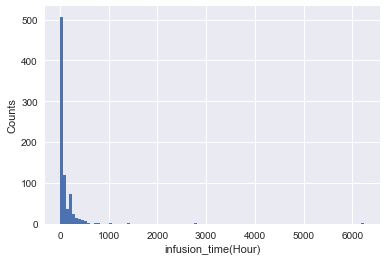

In [106]:
ax=infusion_time_df['unified_infusion_time'].hist(bins=100)
ax.set_xlabel('infusion_time(Hour)')
ax.set_ylabel("Counts")

## Cut the infusion time at 1000


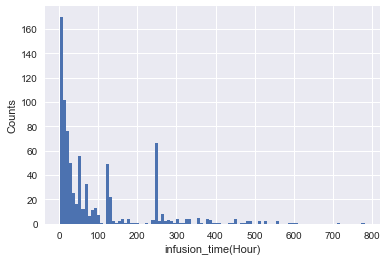

In [107]:
infusion_time_selected_df = infusion_time_df.query('unified_infusion_time<1000')
ax=infusion_time_selected_df['unified_infusion_time'].hist(bins=100)
ax.set_xlabel('infusion_time(Hour)')
ax.set_ylabel("Counts")
infusion_time_df = infusion_time_df.sort_values(by=['PATIENT_SK', 'MED_STARTED_DT_TM'])


In [108]:
infusion_time_df['ORDER_STRENGTH'].describe()

count    354.000000
mean     113.870056
std      191.959790
min        0.000000
25%        8.000000
50%       50.000000
75%       80.000000
max      800.000000
Name: ORDER_STRENGTH, dtype: float64

Text(0,0.5,'Order strength')

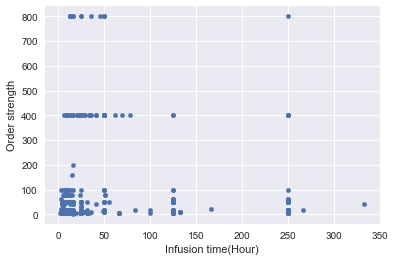

In [109]:
infusion_time_selected_os_valid = infusion_time_selected_df.query('ORDER_STRENGTH>0')
plt.scatter(infusion_time_selected_os_valid["unified_infusion_time"], infusion_time_selected_os_valid['ORDER_STRENGTH'], s=20)
plt.xlabel('Infusion time(Hour)')
plt.ylabel('Order strength')

## The relationship between infusion rate and infusion time

In [110]:
infusion_time_df[['PATIENT_SK', 'NDC_CODE','INFUSION_RATE',
                           'unified_infusion_time', 'stop_start_gap',
                           "TOTAL_DISPENSED_DOSES",'DOSE_QUANTITY', 'ORDER_STRENGTH', 'ORDER_VOLUME',
                           'MED_STARTED_DT_TM', 'MED_STOPPED_DT_TM', 'MED_DISCONTINUED_DT_TM']]  

,PATIENT_SK,NDC_CODE,INFUSION_RATE,unified_infusion_time,stop_start_gap,...,ORDER_STRENGTH,ORDER_VOLUME,MED_STARTED_DT_TM,MED_STOPPED_DT_TM,MED_DISCONTINUED_DT_TM
0,45419,641614225,37.313433,6.700000,12.950000,...,NaN,250.0,2013-10-22 21:18:00,2013-10-23 10:15:00,2013-10-23 10:15:00
2,96529,24112302,0.000000,31.250000,4.316667,...,4.0,0.0,2006-07-05 03:00:00,2006-07-05 07:19:00,2006-07-05 07:19:00
1,96529,24112302,0.000000,4.016667,6.800000,...,8.0,0.0,2006-07-05 08:00:00,2006-07-05 14:48:00,2006-07-05 14:48:00
3,173454,24112302,0.410000,9.766667,1.083333,...,4.0,4.0,2004-05-08 13:00:00,2004-05-08 14:05:00,2004-05-08 14:05:00
4,173454,10019016312,0.980000,5.083333,1.083333,...,50.0,5.0,2004-05-08 13:00:00,2004-05-08 14:05:00,2004-05-08 14:05:00
5,313860,517190525,0.000000,25.000000,49.166667,...,800.0,0.0,2007-05-13 23:16:00,2007-05-16 00:26:00,2007-05-16 00:26:00
6,313860,517040525,0.000000,10.000000,41.866667,...,50.0,0.0,2007-05-14 06:34:00,2007-05-16 00:26:00,2007-05-16 00:26:00
7,314174,55390000210,5.000000,50.000000,122.716667,...,NaN,250.0,2012-02-17 06:20:00,2012-02-22 09:03:00,2012-02-22 09:03:00
8,318405,517190525,0.000000,16.700000,70.416667,...,800.0,0.0,2007-04-07 01:48:00,2007-04-10 00:13:00,2007-04-10 00:13:00
9,549585,10019016301,2.439024,102.500000,14.833333,...,NaN,250.0,2014-02-25 08:50:00,2014-02-25 23:40:00,2014-02-25 23:40:00


In [111]:
time_gap = infusion_time_df.eval('unified_infusion_time-stop_start_gap')
print('The observations that infusion time is small than stop_start_gap: {} (Out of 880)'.format(sum(time_gap<0)))


The observations that infusion time is small than stop_start_gap: 360 (Out of 880)


# Infusion rate

In [112]:
infusion_time_df['INFUSION_RATE'].describe()

count    811.000000
mean       6.784187
std       11.879114
min        0.000000
25%        0.000000
50%        1.000000
75%        7.507508
max      100.000000
Name: INFUSION_RATE, dtype: float64

In [113]:
infusion_rate_valid =  infusion_time_df.query('INFUSION_RATE>0') 
infusion_rate_valid = pd.merge(pat_enc_final[['ENCOUNTER_ID']],
                       infusion_rate_valid, on='ENCOUNTER_ID')
print("The number of observations with valid infusion rate: {}".format(infusion_rate_valid.shape[0]))
print("The number of patients with valid infusion rate: {}".format(infusion_rate_valid['PATIENT_SK'].nunique()))

The number of observations with valid infusion rate: 536
The number of patients with valid infusion rate: 368


Text(0,0.5,'Counts')

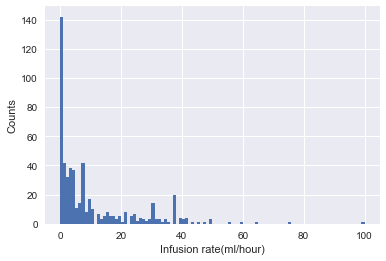

In [114]:
infusion_rate_valid['INFUSION_RATE'].describe()
ax=infusion_rate_valid['INFUSION_RATE'].hist(bins=100)
ax.set_xlabel('Infusion rate(ml/hour)')
ax.set_ylabel('Counts')

Text(0,0.5,'Order strength')

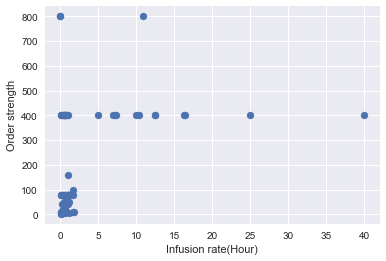

In [115]:
infusion_rate_os_valid = infusion_rate_valid.query('ORDER_STRENGTH>0')
plt.scatter(infusion_rate_os_valid["INFUSION_RATE"], infusion_rate_os_valid['ORDER_STRENGTH'] )
plt.xlabel('Infusion rate(Hour)')
plt.ylabel('Order strength')

# Combine valid infusion rate table with blood pressure

306

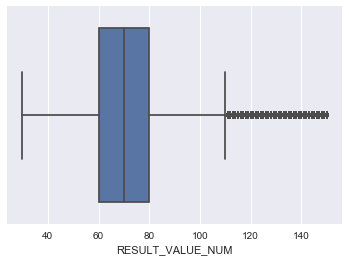

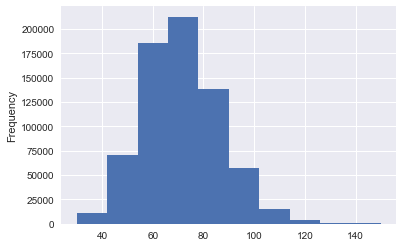

In [116]:
# Combine with the blood pressure
Diastolic_BP = pd.read_csv(root_direc+'/vital_sign/Diastolic_BP.csv')
plt.figure()
sns.boxplot(Diastolic_BP['RESULT_VALUE_NUM'])
plt.figure()
Diastolic_BP['RESULT_VALUE_NUM'].plot.hist()

# Next dig out the time different between first EVENT_DATE and
# first medication time

Diastolic_BP = Diastolic_BP.drop('PATIENT_ID', 1)
Diastolic_BP['EVENT_DATE'] = pd.to_datetime(Diastolic_BP['EVENT_DATE'])
# Merge the Diastolic_BP with patient level table
Diastolic_BP = pd.merge(Diastolic_BP,
                        pat_enc_final[['PATIENT_SK', 'ENCOUNTER_ID']],
                        how='inner', on='ENCOUNTER_ID')
# Group the Diastolic_BP by patient_sk
Diastolic_BP = Diastolic_BP.sort_values(by=['PATIENT_SK', 'EVENT_DATE'])
uniq_pat_sk= infusion_rate_valid['PATIENT_SK'].unique()
valid_pat_sk_indc = np.in1d(
        uniq_pat_sk, Diastolic_BP['PATIENT_SK'].unique())
valid_pat_sk1 = uniq_pat_sk[valid_pat_sk_indc]
valid_pat_sk1.shape[0]

Systolic_BP = pd.read_csv(root_direc+'/vital_sign/Systolic_BP.csv')
Systolic_BP = Systolic_BP.drop('PATIENT_ID', 1)
Systolic_BP['EVENT_DATE'] = pd.to_datetime(Systolic_BP['EVENT_DATE'])
# Merge the Diastolic_BP with patient level table
Systolic_BP = pd.merge(Systolic_BP,
                       pat_enc_final[['PATIENT_SK', 'ENCOUNTER_ID']],
                       how='inner', on='ENCOUNTER_ID')
# Group the Systolic_BP by patient_sk
Systolic_BP = Systolic_BP.sort_values(by=['PATIENT_SK', 'EVENT_DATE'])
valid_pat_sk_indc2 = np.in1d(
        uniq_pat_sk, Systolic_BP['PATIENT_SK'].unique())
valid_pat_sk2 = uniq_pat_sk[valid_pat_sk_indc]
valid_pat_sk2.shape[0]

## Patients who have blood pressure test before the medication and after the medication

In [122]:
concerned_pat = []
vaso = []
vaso_period = []
for patient_sk in valid_pat_sk1:
    sample_diasbp = Diastolic_BP[Diastolic_BP['PATIENT_SK'] == patient_sk]
    sample_sysbp = Systolic_BP[Systolic_BP['PATIENT_SK'] == patient_sk]
    sample_med = infusion_rate_valid[
        infusion_rate_valid['PATIENT_SK'] == patient_sk]
    # Convert the time as the time difference from the first event time
    time_diasbp = sample_diasbp['EVENT_DATE'] - sample_med[
            'MED_STARTED_DT_TM'].iloc[0]
    time_sysbp = sample_sysbp['EVENT_DATE'] - sample_med[
            'MED_STARTED_DT_TM'].iloc[0]
    vaso_start = sample_med['MED_STARTED_DT_TM'] - sample_med[
            'MED_STARTED_DT_TM'].iloc[0]
    vaso_stop = sample_med['MED_STOPPED_DT_TM'] - sample_med[
            'MED_STARTED_DT_TM'].iloc[0]
    vaso_discon = sample_med['MED_DISCONTINUED_DT_TM'] - sample_med[
            'MED_STARTED_DT_TM'].iloc[0]
    # Convert the resolution of time from second to hour
    time_diasbp = time_diasbp.apply(total_seconds)
    time_sysbp = time_sysbp.apply(total_seconds)
    vaso_start = vaso_start.apply(total_seconds)
    vaso_over = vaso_start+sample_med['unified_infusion_time']
    vaso_stop = vaso_stop.apply(total_seconds)
    vaso_discon = vaso_discon.apply(total_seconds)
    vaso_end = pd.DataFrame({"vaso_stop":vaso_stop, "vaso_discon":vaso_discon,
                             "vaso_over":vaso_over}).min(axis=1)
    vaso_period.append(vaso_end)
    temp= time_diasbp-vaso_end.iloc[0]
    if (min(time_diasbp)<0) & (max(temp)>0):
            concerned_pat.append(patient_sk)
            vaso.append(sample_med['GENERIC_NAME'])
            
len(concerned_pat)

207

In [118]:
print("The number of patients: {}".format(len(concerned_pat)))

The number of patients: 207


In [119]:
vaso = list(chain.from_iterable(vaso))
pd.Series(vaso).value_counts()

norepinephrine    153
phenylephrine     134
dopamine           20
dtype: int64

In [123]:
vaso_period = list(chain.from_iterable(vaso_period))
pd.Series(vaso_period).describe()


count     436.000000
mean       66.427867
std       109.605370
min         0.100000
25%        10.416667
50%        33.300000
75%        74.262500
max      1460.400000
dtype: float64

Text(0,0.5,'Counts')

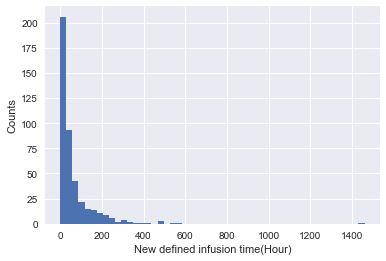

In [126]:
ax=pd.Series(vaso_period).hist(bins=50)
ax.set_xlabel('New defined infusion time(Hour)')
ax.set_ylabel('Counts')

### Have a look at the concentration

In [121]:
temp1 = infusion_rate_valid[infusion_rate_valid['PATIENT_SK'].isin(concerned_pat)]
temp1['PRODUCT_STRENGTH_DESCRIPTION'].value_counts(dropna=False)

1 mg/ml                  133
10 mg/ml                 132
NaN                       13
5%-160 mg/100 ml          11
4 mg/250 ml-NaCl 0.9%      9
5%-320 mg/100 ml           4
80 mg/ml                   4
40 mg/ml                   1
Name: PRODUCT_STRENGTH_DESCRIPTION, dtype: int64

C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotli

C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotli

C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotli

C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotli

C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotli

C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotli

C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotli

C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotli

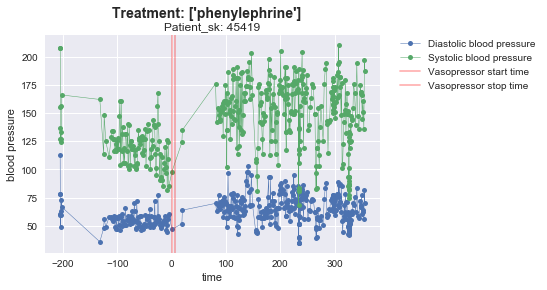

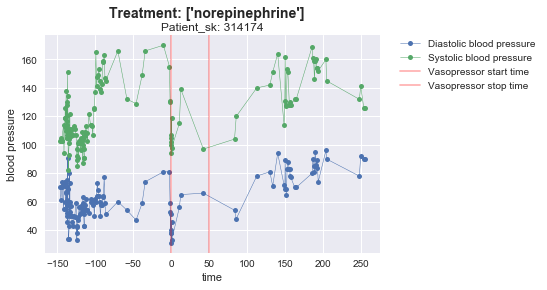

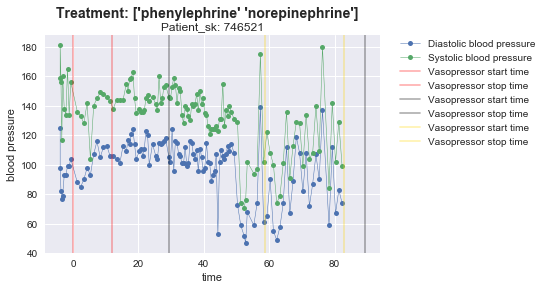

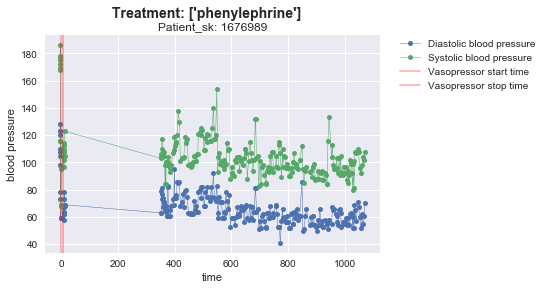

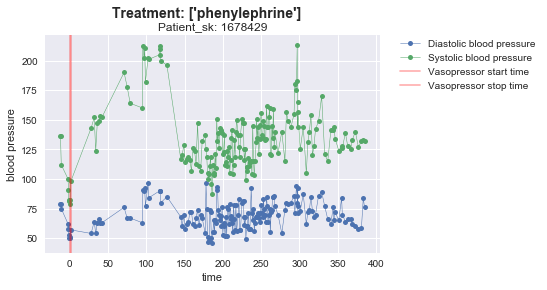

...

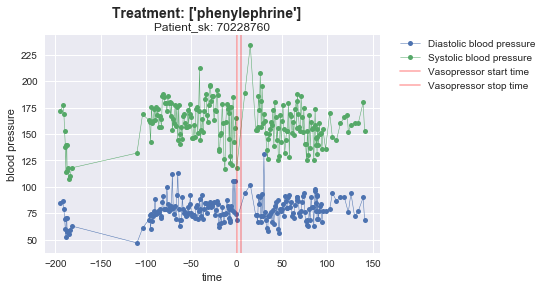

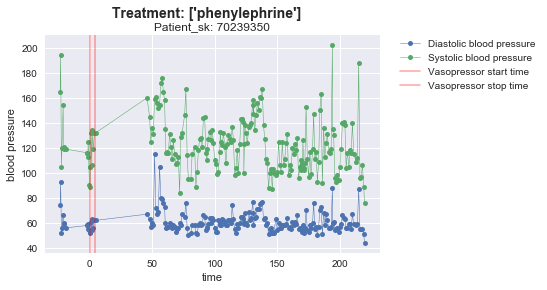

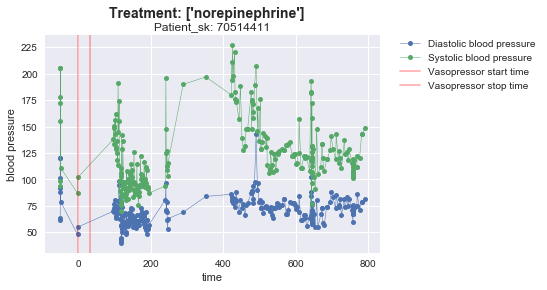

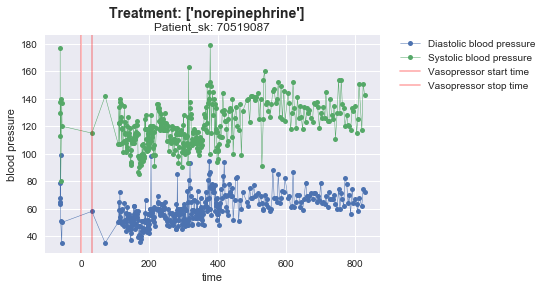

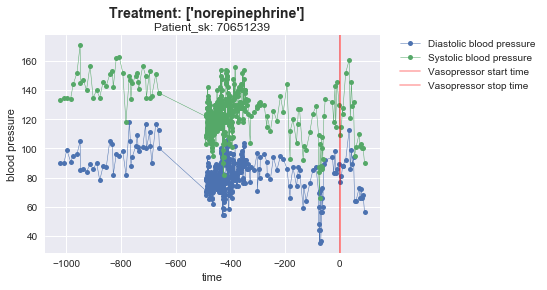

In [120]:
colors = ['red', 'black', 'gold', 'red', 'black', 'gold', 'red', 'black', 'gold' ]
for patient_sk in concerned_pat:
    sample_diasbp = Diastolic_BP[Diastolic_BP['PATIENT_SK'] == patient_sk]
    sample_sysbp = Systolic_BP[Systolic_BP['PATIENT_SK'] == patient_sk]
    sample_med = infusion_rate_valid[
        infusion_rate_valid['PATIENT_SK'] == patient_sk]
    # Convert the time as the time difference from the first event time
    time_diasbp = sample_diasbp['EVENT_DATE'] - sample_med[
            'MED_STARTED_DT_TM'].iloc[0]
    time_sysbp = sample_sysbp['EVENT_DATE'] - sample_med[
            'MED_STARTED_DT_TM'].iloc[0]
    vaso_start = sample_med['MED_STARTED_DT_TM'] - sample_med[
            'MED_STARTED_DT_TM'].iloc[0]
    vaso_stop = sample_med['MED_STOPPED_DT_TM'] - sample_med[
            'MED_STARTED_DT_TM'].iloc[0]
    vaso_discon = sample_med['MED_DISCONTINUED_DT_TM'] - sample_med[
            'MED_STARTED_DT_TM'].iloc[0]
    # Convert the resolution of time from second to hour
    time_diasbp = time_diasbp.apply(total_seconds)
    time_sysbp = time_sysbp.apply(total_seconds)
    vaso_start = vaso_start.apply(total_seconds)
    vaso_over = vaso_start+sample_med['unified_infusion_time']
    vaso_stop = vaso_stop.apply(total_seconds)
    vaso_discon = vaso_discon.apply(total_seconds)
    vaso_end = pd.DataFrame({"vaso_stop":vaso_stop, "vaso_discon":vaso_discon,
                             "vaso_over":vaso_over}).min(axis=1)
    # We care more about the time interval near the interval bewteen the startted
    # time and stopped time
    threshold = 1000000
    time_interval_interested = [vaso_start.iloc[0]-threshold,
                                vaso_end.iloc[0]+threshold]
    time_interested_dias = pd.cut(time_diasbp, time_interval_interested)
    diasbp_interested = sample_diasbp[time_interested_dias.notnull()][
            'RESULT_VALUE_NUM']
    time_diasbp = time_diasbp[time_interested_dias.notnull()]
    time_interested_sys = pd.cut(time_sysbp, time_interval_interested)
    sysbp_interested = sample_sysbp[time_interested_sys.notnull()][
            'RESULT_VALUE_NUM']
    time_sysbp = time_sysbp[time_interested_sys.notnull()]
    
    fig, ax = plt.subplots()
    ax.plot(time_diasbp, diasbp_interested, "-o", markersize=5,
            linewidth=0.5, label="Diastolic blood pressure")
    ax.plot(time_sysbp, sysbp_interested, "-o", markersize=5,
            linewidth=0.5, label='Systolic blood pressure')
  
    for i, val in enumerate(vaso_start):
            ax.axvline(x=val, alpha=0.3, color=colors[i],
                       label='Vasopressor start time')
            ax.axvline(x=vaso_end.iloc[i], alpha=0.3, color=colors[i],
                       label='Vasopressor stop time')
    
#        ax.text(time_med.iloc[i], ax.get_ylim()[0],
#                sample_med['GENERIC_NAME'].iloc[i], ha='center', color='red')
#        ax.text(time_med.iloc[i], ax.get_ylim()[1],
#                "dose: {}" .format(
#                      round(sample_med['TOTAL_CONSUMED_STRENGTH'].iloc[i], 2)),
#                ha='center', color='red')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    fig.suptitle('Treatment: {}'.format(sample_med['GENERIC_NAME'].unique()),
                 fontsize=14, fontweight='bold')
    ax.set_title('Patient_sk: {}'.format(patient_sk))
    ax.set_xlabel('time')
    ax.set_ylabel('blood pressure')